# 🌟 Lecture 14: Visualizing and Understanding

- CS231n_2019강의를 정리한 내용입니다

# 1. What's going on inside Convolutional Networks?

-  ConvolutionNetwork 내부에서는 무슨 일이 벌어지고 있는것일까?

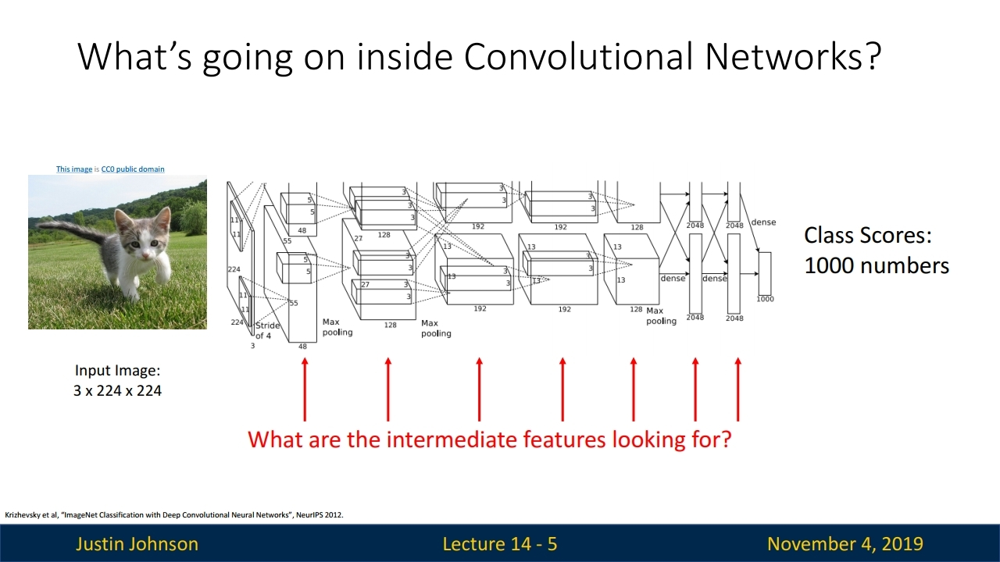

## (1)  First Layer : Visualize Filters

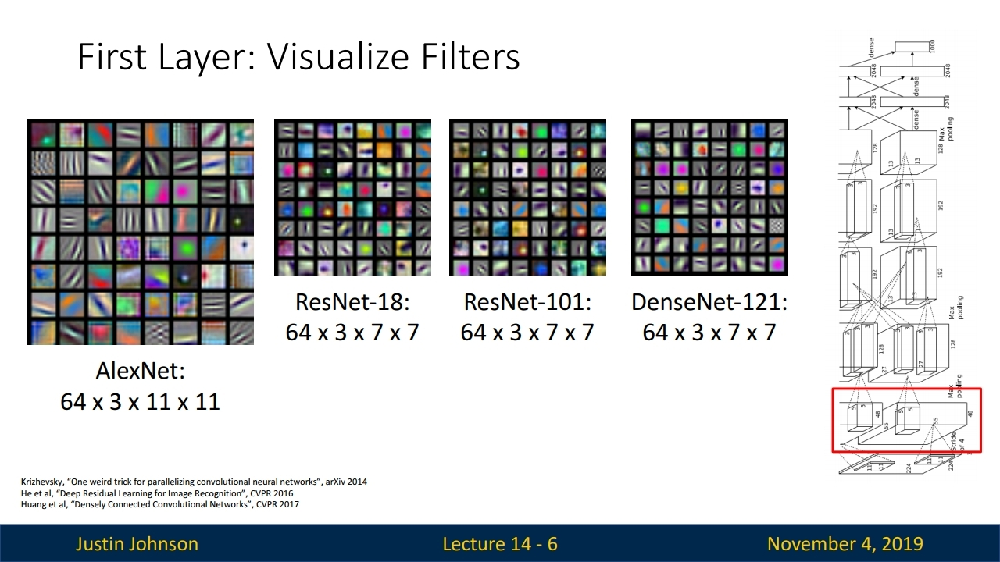

- 다양한 색상과 선 모양의 패턴들을 확인(수많은 edge성분, 보색 등)
- 사람도 시각 피질의 원초적인 단계에서 이러한 것을 봄
- AlexNet, ResNet-18, ... 등 어떤 모델을 이용하여 학습시켜도 초기 layer에서는 비슷하게 나타남.

## (2) Higher Layers: Visualize Filters

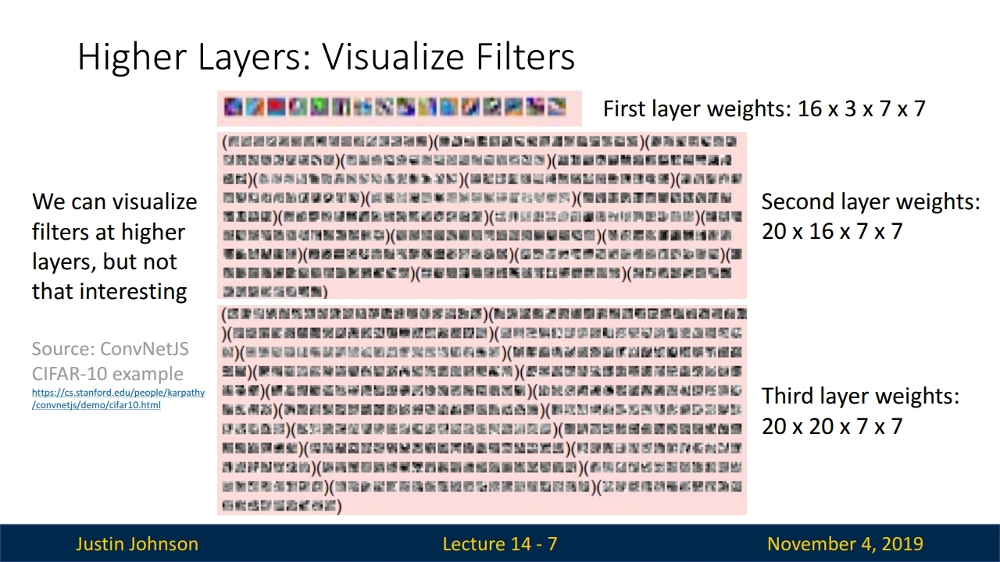


- 레이어를 조금 더 내려가면           
- 한눈에 보기에도 이해하기 어려워보이는 결과 -> 초기 레이어 시각화 방식으로는 해석하기 어려움          
- 두번째 레이어에서 찾는것: 두번째 레이어의 결과를 최대화시키는 첫번째 레이어의 출력 패턴이 무엇인지            
- 이미지 관점에서 레이어 해석이 어려움 -> 레이어가 깊어질수록 알아보기 어렵고 직관을 얻기도 힘듬 (조금 다른 기법의 해석 방식이 필요)         

## (3)  Last Layer

- ConvolutionNetwork의 마지막 layer는 어떤일을 하고 있을까?

- AlexNet의 마지막 레이어로부터 4096차원 벡터가 출력

- 많은 이미지를 돌려서 해당 벡터를 모두 모음

- 이를 활용해서 마지막 레이어를 시각화하는 방법은?

<br/>

### 👆 [방법1] Nearest Neighbors

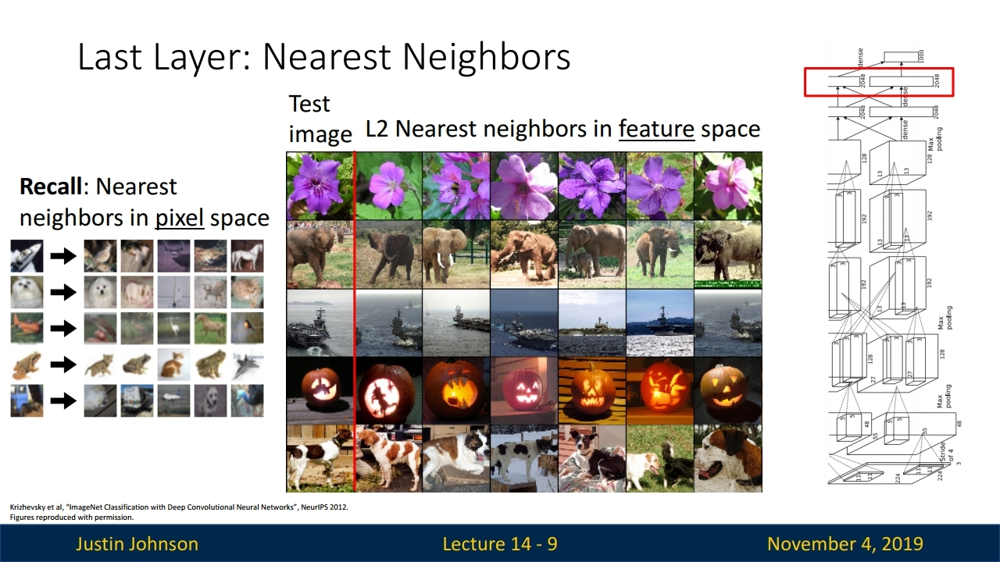

<br/>

* in **pixel space**
    - CIFAR-10 데이터들의 이미지픽셀 공간에서 Nearest Neighbors을 하면 가장 왼쪽 이미지를 기준으로 비슷한 이미지를 잘 찾아냄

<br/>

* in **feature vector space**
    - 두번째 줄 코끼리 모습이 좌,우가 반대임에도 불구하고 feature vector space에서는 잘 찾아냄
    - pixel 관점에서는 매우 다르지만 feature 관점에서는 유사

<br/>

### ✌  [방법2] Dimensionality Reduction (차원 축소)

- **PCA** 는 4096-dim의 고차원 feature vector를 2-dim 으로 압축시키는 기법
    - 이 방법을 통해 feature vector를 조금 더 직접적으로 시각화 가능

- 조금 더 복잡한 **t-SNE(t-distributed stochastic neighbor embeddings)** 를 이용하여 더 잘 시각화 할 수도 있음

- (참고) 고차원 데이터의 차원 축소와 시각화 방법(PCA vs t-SNE) https://skyeong.net/284
- t-SNE: 2차원 산점도를 이용해 시각화 용도로 많이 사용 https://data-newbie.tistory.com/24

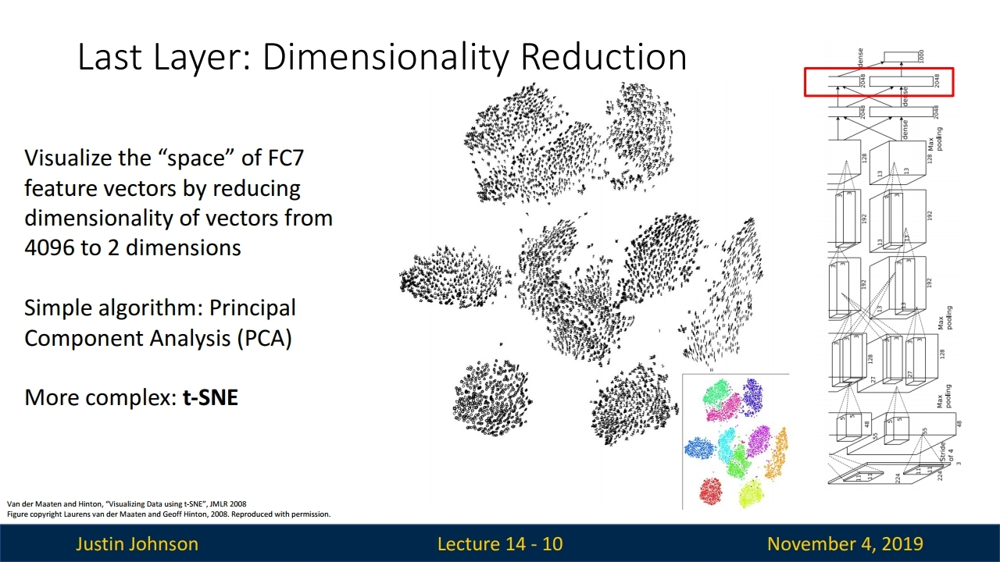

- t-SNE가 MNST의 28x28-dim 데이터를 입력으로 받아 2-dim으로 압축하여 시각화

- 군집들은 MNIST의 숫자를 의미



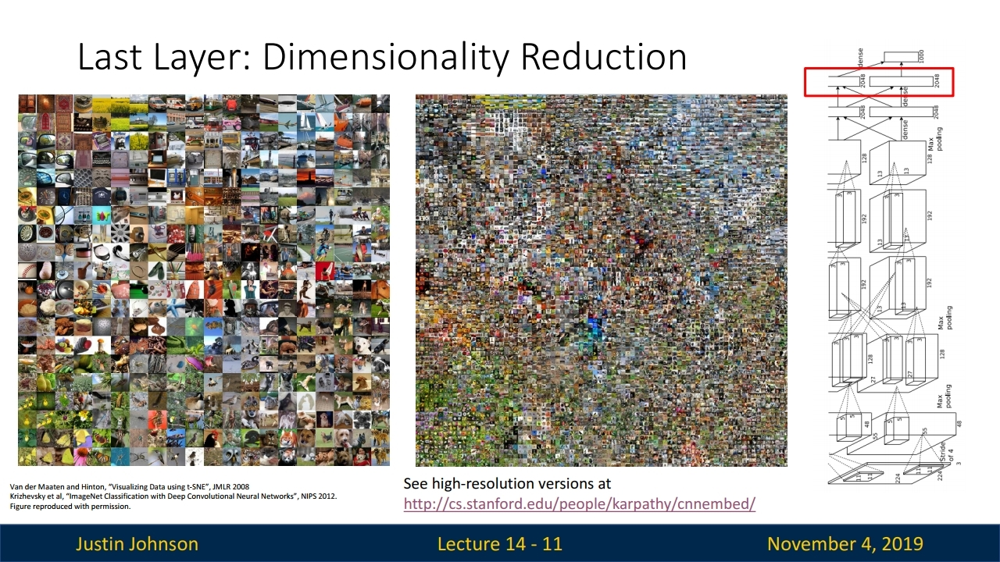

- t-SNE visualization of CNN codes (stanford.edu)

-  t-SNE을 적용하여 4096-dim에서 2-dim으로 압축하여 시각화

- 이를 통해 학습된 feature vector space의 모습을 어렴풋이 추측해 볼 수 있음
    - 좌하단의 초록색 군집은 다양한 꽃들이 있는 곳이고, 다른 곳에는 동물, 지역 등등


<br/> 

### 👌  [방법3] Visualizing Activations

- 중간 레이어의 가중치를 시각화 하는 것은 해석이 어려움
    => 가중치가 아닌 **activation map을 시각화** 하는 방법도 있음
    
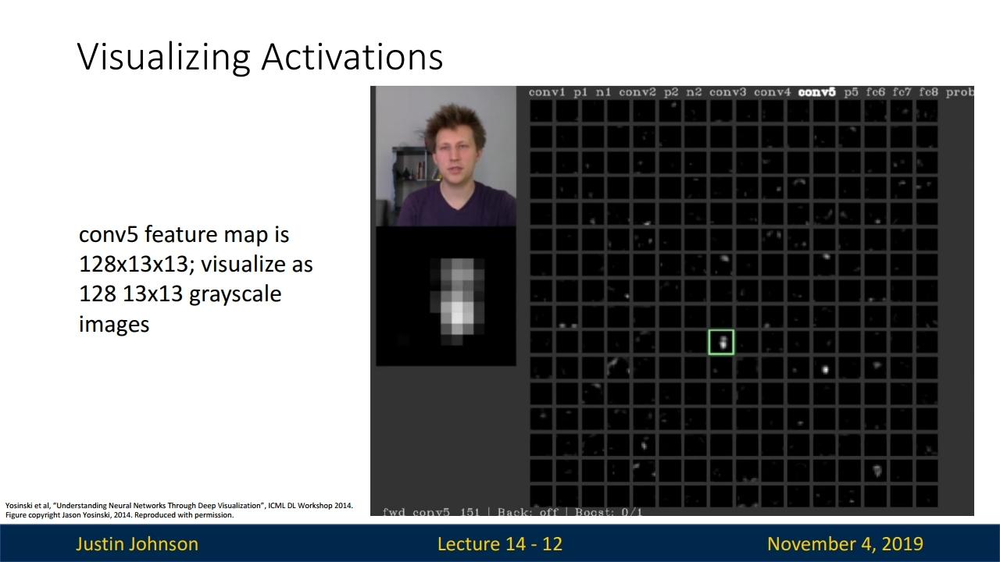

- 초록색 부분의 경우 사람의 얼굴 모양을 보고 활성화되는 것 같아 보임.
    즉, 네트워크의 어떤 레이어에서는 사람의 얼굴을 찾고 있는 것일 수도 있음

### 👉 Maximally Activating Patches

- 특정 레이어의 활성화를 최대로 하는 패치들을 시각화 하는 방법

- 한 뉴런은 conv5 activation map의 한 scalar 값을 의미
    : 이 때, convolutional layer 이기에 한 채널의 모든 뉴런은 모든 같은 가중치를 공유하게 됨

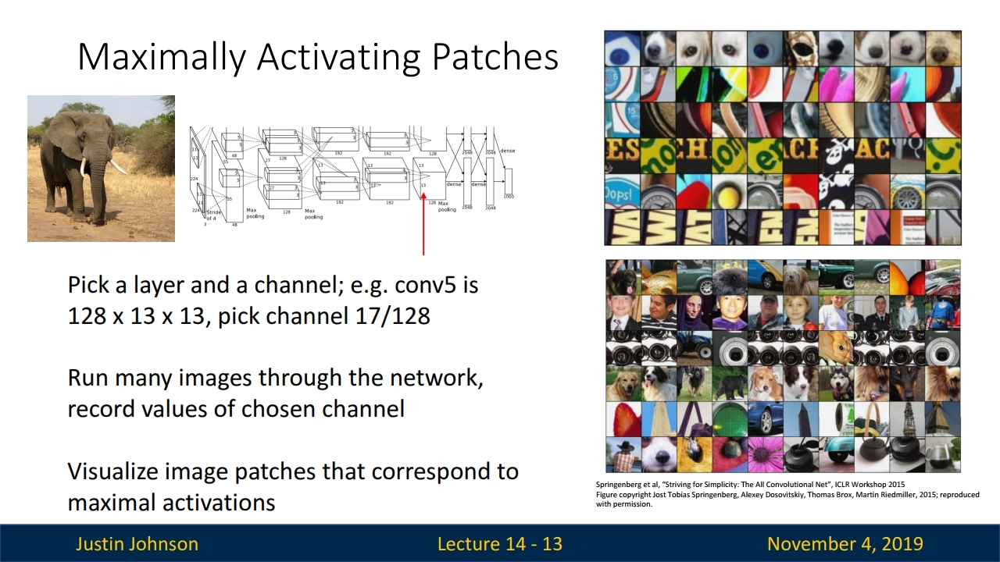

- 위의 이미지의 각 행에 있는 패치들은 모두 하나의 뉴런에서 나온 것임
    - 여기서 해당 레이어가 convolutional layer이기에 이미지 전체가 아닌 일부분만 보고 있음 (receptive field가 작다는 의미)
    - 동그라미(아마도 눈) 모양을 찾고 있음


- 오른쪽 아래 이미지들은 더 깊은 layer로부터 추출된 패치들임 (receptive field가 넓다는 의미, 이미지를 더 넓게 보고 있음)
    - 사람의 모습(얼굴, 2번째 행) 등을 찾고 있음

### 👉 [방법] Occlusion Experiment

- 어느 부분이 분류를 결정짓는 근거가 되는지 알아보는 실험

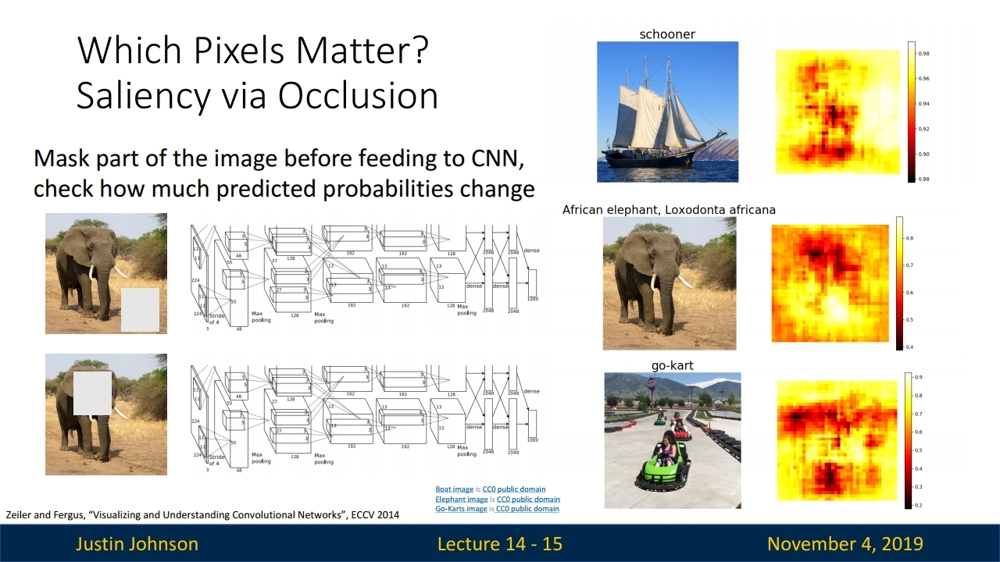

- 이미지를 가리고 CNN에 넣었을 때, 어느 부분이 가려졌을 경우 네트워크의 예측확률이 크게 변하는지를 Map으로 나타냄

- (참고) 이런 과정은 학습하는데 어떤 도움을 주거나 하는 것은 아니지만 인간이 네트워크의 학습 과정을 이해하는데 사용 가능

### 👆 [방법1] Saliency via Backprop

- forward pass: 확률을 계산
- 입력 이미지의 각 픽셀들에 대해 예측한 클래스 스코어의 gradient를 계산하는 방법
    - RGB 채널을 통한 최대와 절댓값을 취함 
    - 1차 근사적 방법으로 어떤 픽셀이 영향력 있는지 알려줌
    
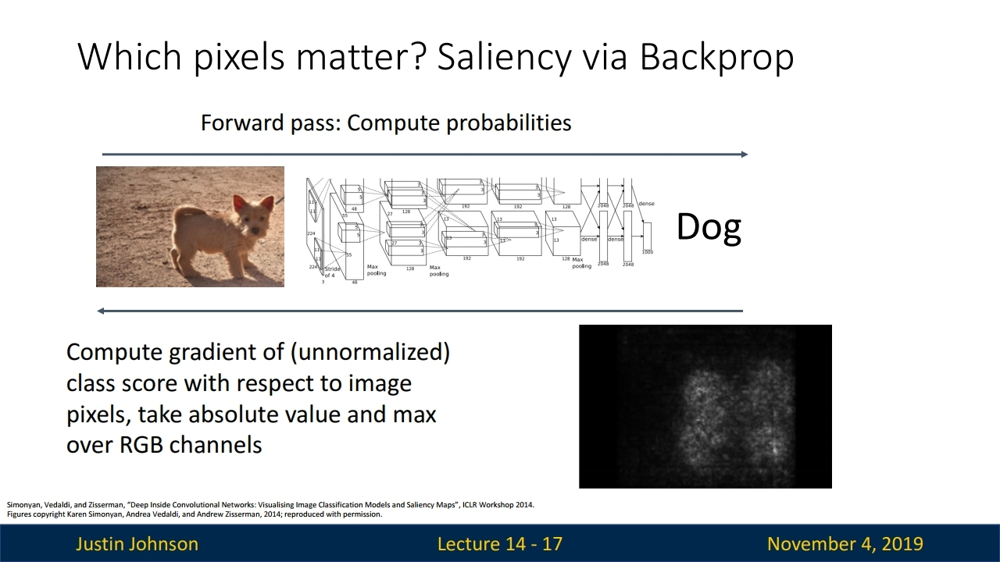

- Saliency map을 통과하면 dog의 윤곽이 드러남

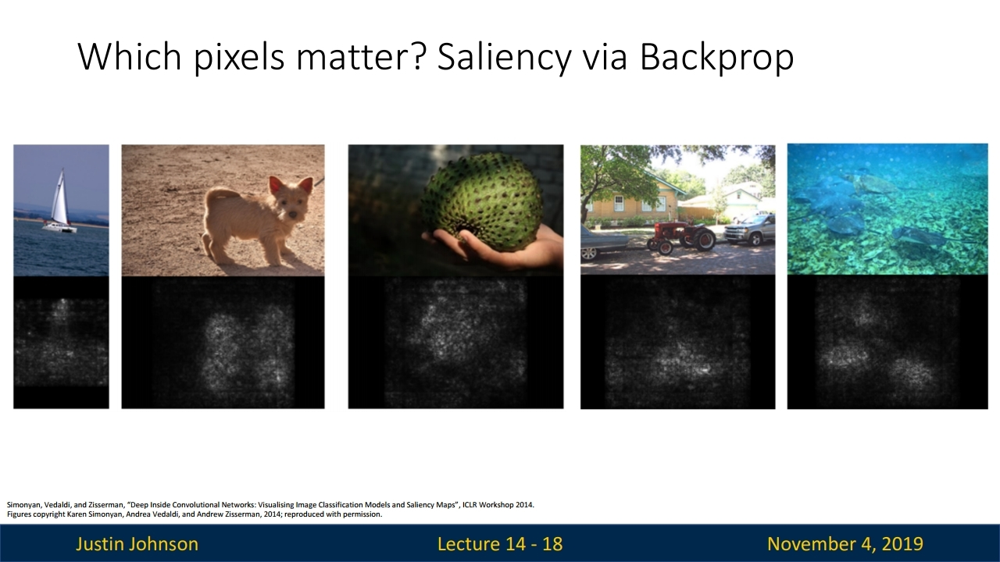

### 👉Grabcut

- saliency map에서 Grabcut의 활용

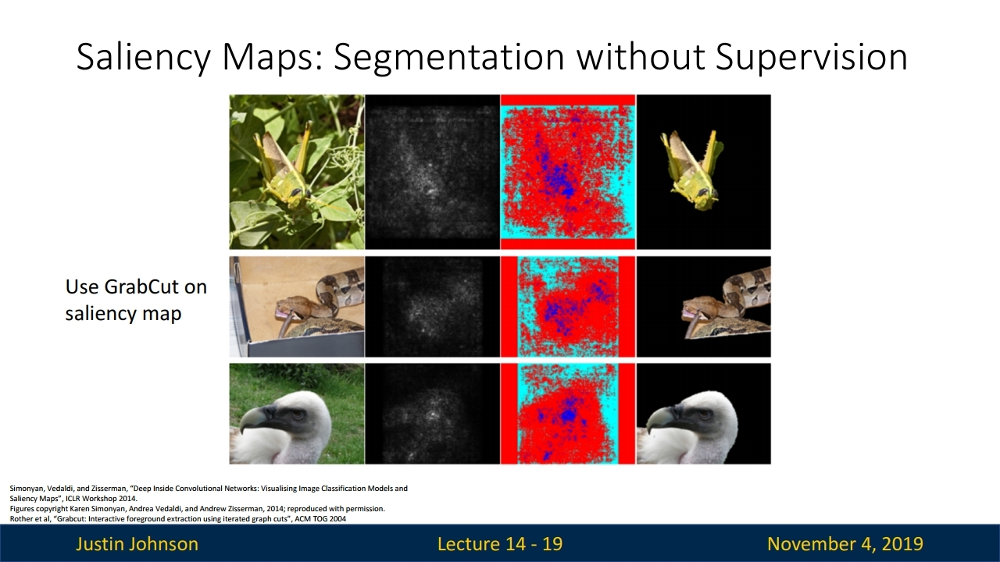

- GrabCut을 사용하면 segmentation label 없이 segmentation 가능

- GrabCut 은 interactive segmentation algorithm으로 supervision으로 만들어지는 결과에 비해 성능이 떨어짐


* Grabcut: 그래프 기반 알고리즘으로  이미지 형태의 입력 그래프와 background에 대한 초깃값이 주어지면 적절한 segmentation에 대한 에너지를 최소화하는 방향으로 최적의 상태를 찾아가도록 동작. 알고리즘 자체의 근본적인 한계로 인해 segmentation 결과가 입력 이미지의 특성과 초깃값의 품질에 매우 의존적이게 됩니다. 다시 말해, 다양한 입력 이미지마다 해당 이미지에 딱 맞는 적절한 초깃값 mask를 제공해주지 못한다면, 고품질의 결과를 얻을 수 없다는 얘기입니다. 또한, 한 이미지에 여러 개의 오브젝트가 있는 경우(상의, 하의, 가방, 신발 등), 도대체 어떤 오브젝트의 색상을 추출해야 하는지, GrabCut 알고리즘이 그것까지 자동으로 알아낼 수는 없습니다.            
[출처] 딥러닝을 이용해 상품 이미지에서 색상 속성을 추출하기 https://blog.naver.com/tmondev/221482642227

* segmentation: https://blog.naver.com/chrhdhkd/222013933906

### ✌ [방법2]  (guided) Backprop

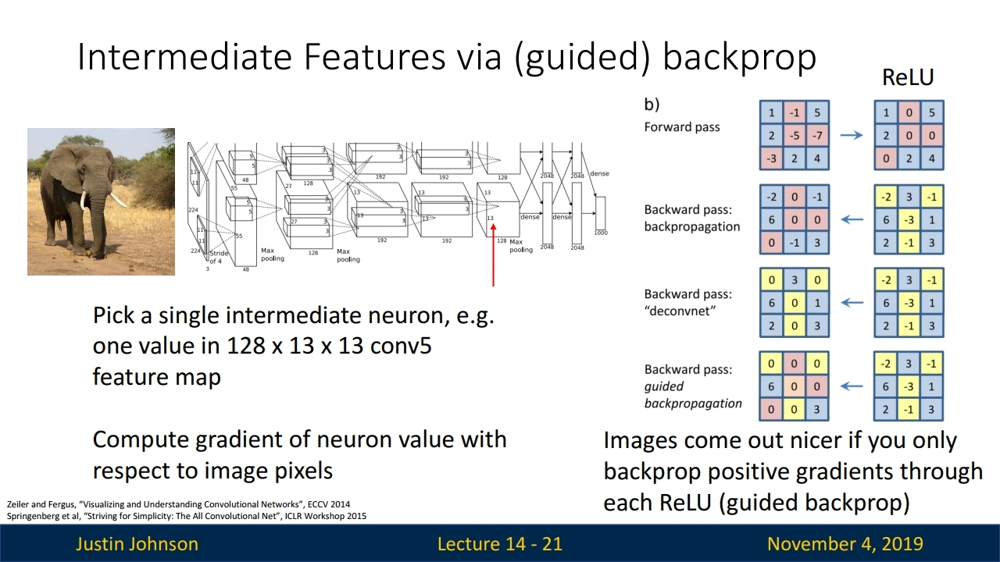

- 클래스 스코어가 아닌 네트워크의 중간 뉴런을 하나 고르고 입력 이미지의 어떤 부분이, 내가 선택한 중간 뉴런의 값에 영향을 주는지를 확인 (Saliency Map 만들기 등)
- **Saliency via Backprop**에서 처럼 이미지의 각 픽셀에 대한 **클래스 스코어의 gradient를 계산**하는 것이 아닌 / 입력 이미지의 각 픽셀에 대한 **네트워크 중간 뉴런의 gradient를 계산**하여 어떤 픽셀이 해당 뉴런에 영향을 주는지 파악


- 오른쪽 그림 설명
    - Foward pass를 통해 ReLU output을 구함 - (1,2)map
    - Backpropagation - Backward pass는 ReLU output인 (1,2)map의 양수 부분에만 gradient를 구함
    - Deconvnet - Backward pass는 gradient가 양수인 부분의 gradient 구함
    - Guided Backpropagation - Backward pass는 
    (1) gradient가 0보다 크고 (2) ReLU output이 양수부분인 gradient만 feature map에 곱하는 방식임 (weighted-average)


- (guided) Backprop은 backprop시 ReLU를 통과할 때 다소 변형됨
    - ReLU 의 gradient의 부호가 양수이면 그대로 통과시키고 부호가 음수이면 backprop하지 않으므로 실제 gradient를 이용하는 것이 아니라 양의 부호인 gradient 만을 고려하게 됨
    - https://donghwa-kim.github.io/guidedprop.html

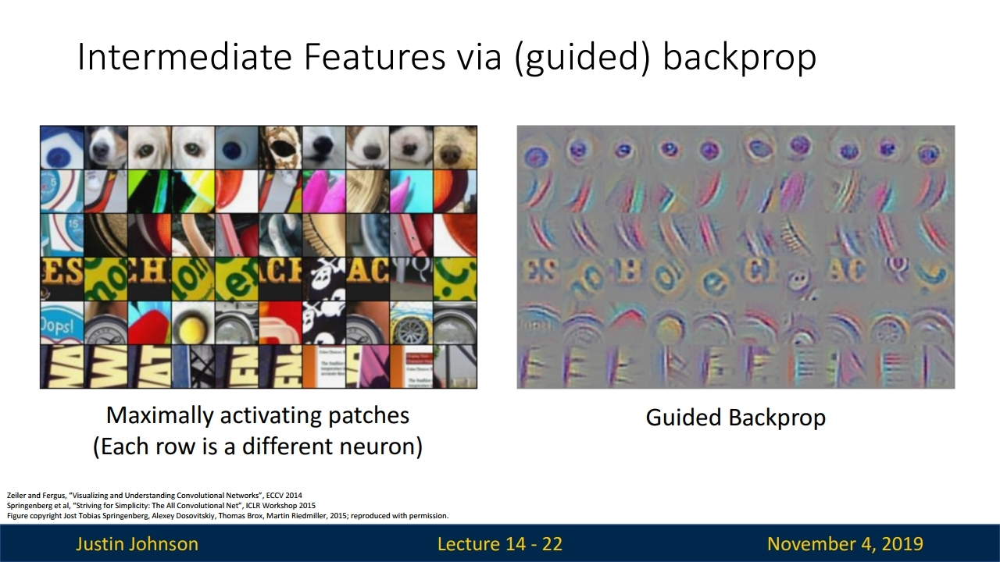


- 앞에서 첫 행을 보고 동그란 무언가(아마도 눈)를 찾고 있는 것이라고 짐작 =>  guided backprop 의 결과를 보니 우리의 짐작이 어느 정도 맞다고 생각할 수 있음

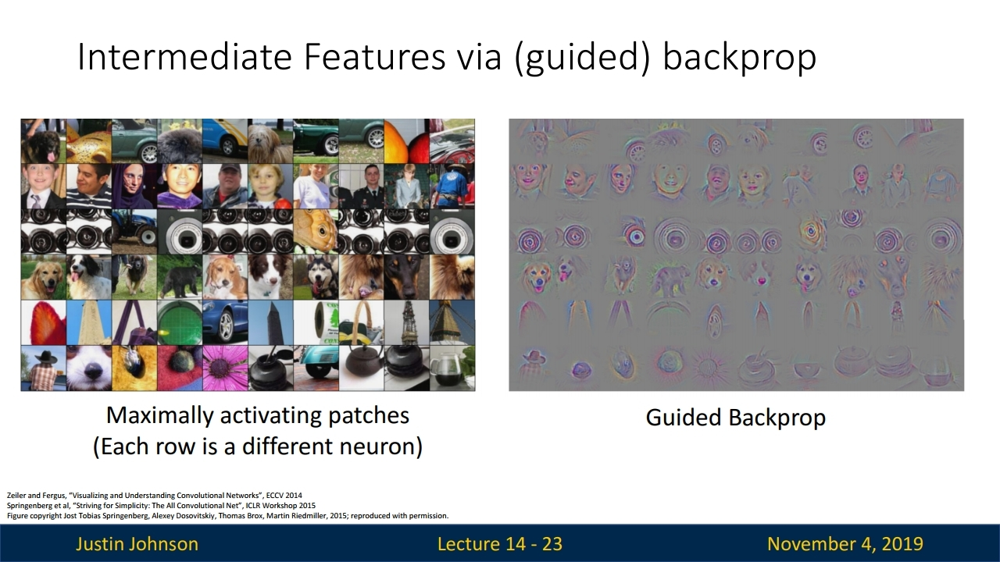


- 이 방법은 고정된 입력 이미지 또는 입력 패치의 어떤 부분이 해당 뉴런에 영향을 끼치는지 알려주기만 함

- 입력 이미지에 고정되지 않은 방법??
- 즉 입력 이미지에 의존적이지 않고 해당 뉴런을 활성시킬 수 있는 일반적인 이미지는??

# 2. Gradient Ascent

- **`(Guided) backprop`**: (이미지에 대한 네트워크 중간 뉴런의 gradient를 계산하여) 뉴런이 반응하는 이미지 부분을 찾음 

- **`Gradient ascent`**: 중간 뉴런 or 클래스 스코어를 최대로 활성화하는 합성된 이미지 생성(가중치 고정)

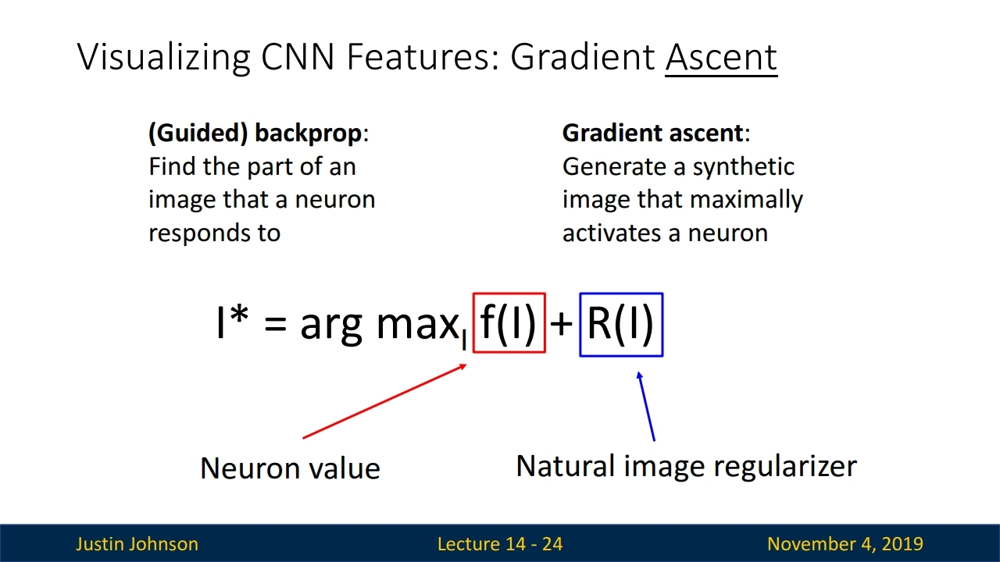


- Gradient ascent는 네트워크의 가중치를 최적화하는 방법이 아님 (가중치들은 모두 고정되어 있고 / 대신 **클래스 스코어가 최대화**될 수 있도록 입력 이미지의 픽셀 값을 바꿔주는 방법)

- 식 설명
 
 1. $argmax_I f(I)$ (Neuron value) : 이미지가 특정 뉴런의 값을 최대화시키는 방향으로 생성     
 2. $R(I)$ (Natural image regularizer) : 생성된 이미지가 비교적 자연스럽도록 강제하는 역할

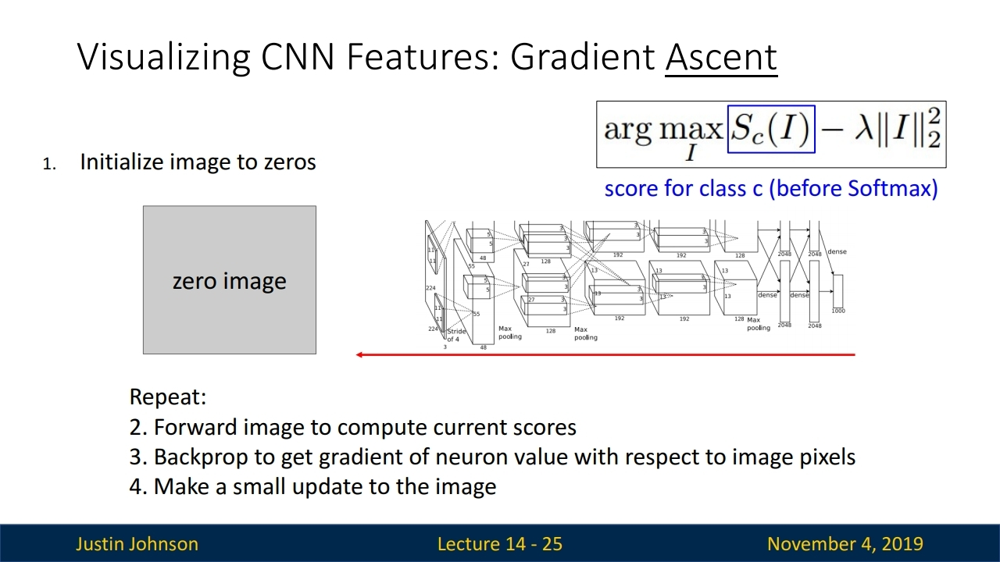

### 🌟 Gradient Ascent를 통해 Model feature들을 시각화 하는 과정

1. Gradient Ascent를 위해서는 초기 이미지가 필요: zeros로 초기화

    - 이미지를 분류하는 문제가 아니라 레이어의 feature들을 시각화하는 것이 목적이므로  처음에 이미지를 input으로 넣는 것보다 zero값을 넣어주는 것이 효과적임(입력 이미지에 의존적이지 않고 해당 뉴런을 활성시킬 수 있는 일반적인 이미지 처리를 위해)
    - zero초기화 된 이미지는 나중에 Gradient Ascent를 통해 특정 필터가 나타내는 이미지 값으로 점차 바뀜, 기대 결과가 나올때까지 반복

2. 이미지를 네트워크에 통과시키고 스코어나 관심있는 뉴런의 값을 계산

    - forward pass 과정을 통과하며 Loss가 계산되고 이 값을 backprop시켜 input image를 update

3. 각 이미지 픽셀에 해당 뉴런 스코어의 gradient를 계산하기 위해 backprop 진행

    - Gradient Ascent는 input image의 값을 업데이터 하는 방법임

4. Gradient Ascent를 이용해서 이미지 픽셀 업데이트.


- 스코어를 최대화시키게 되고, 이 과정을 계속 반복하고 나면  멋진 이미지가 생성됨.

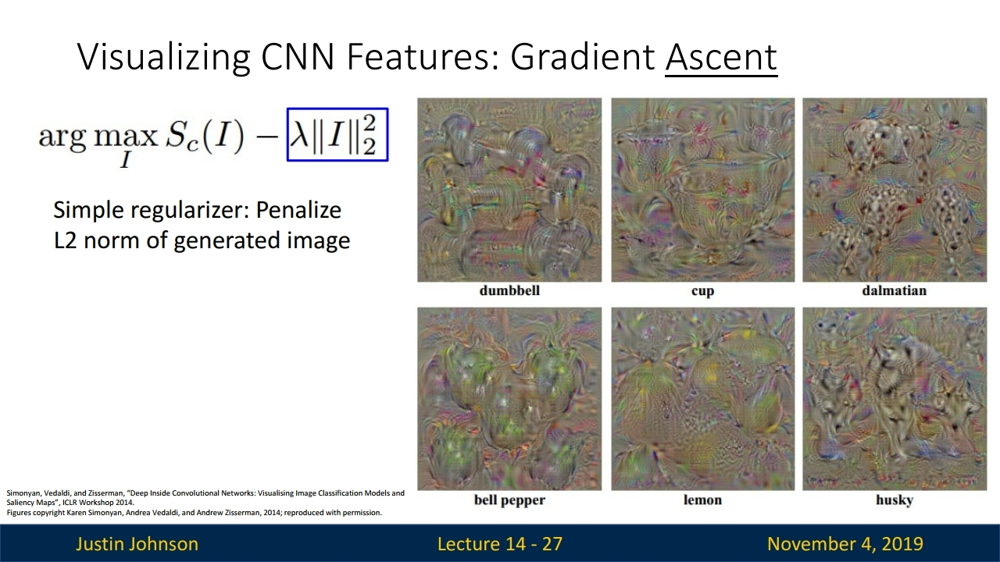

- 위 예제를 보면 많이 중첩된 모습이 보임
    : 달마시안의 경우에는 달마시안의 특징이 아주 잘 나타난 것을 확인할 수 있다.

- 색상이 무지개 색인 이유는 Gradient Ascent가 unconstrained value이기 때문에 0~255 의 pixel value로 normalize 하면서 생기는 오류임


<br/>

regularization term이 없어도 이미지는 나타나겠지만 random noise처럼 보이게 됨 -> 이는 또 다른 의미를 갖음

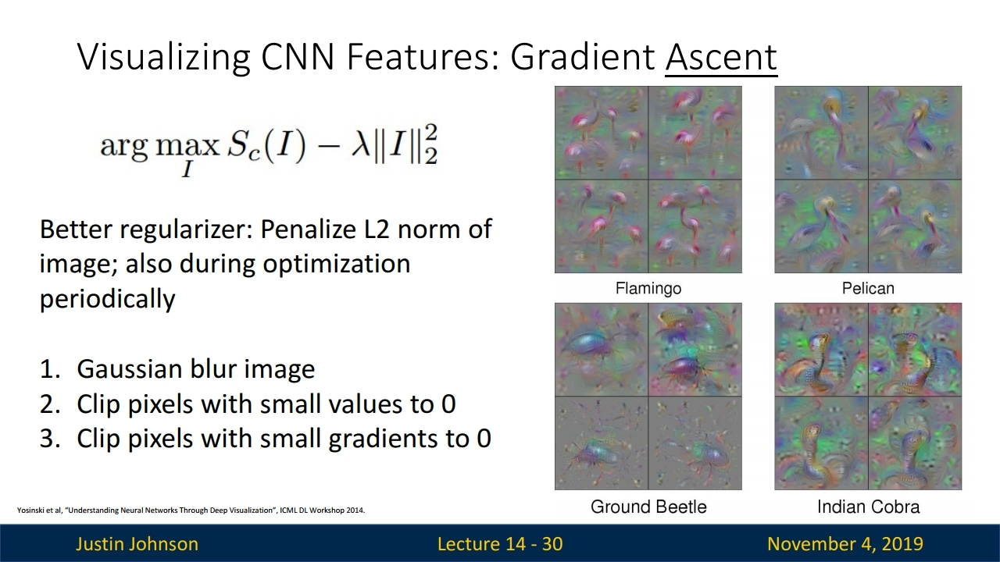


- better regularizer: L2 norm 에다가 주기적으로 Gaussian blur를 적용하는 방법
    1. Gaussian blur 이미지
    2. 값이 작은 픽셀들을 0으로 만듬
    3. gradient가 작은 값을 0으로 만듬

- 값이 작은 픽셀들은 0으로 만들고, gradient가 작은 값도 0으로 만듬
(일종의 projected Gradient descenct)

- 이렇게 만든 방법은 훨씬 더 깔끔한 이미지를 위와 같이 얻게 해줌

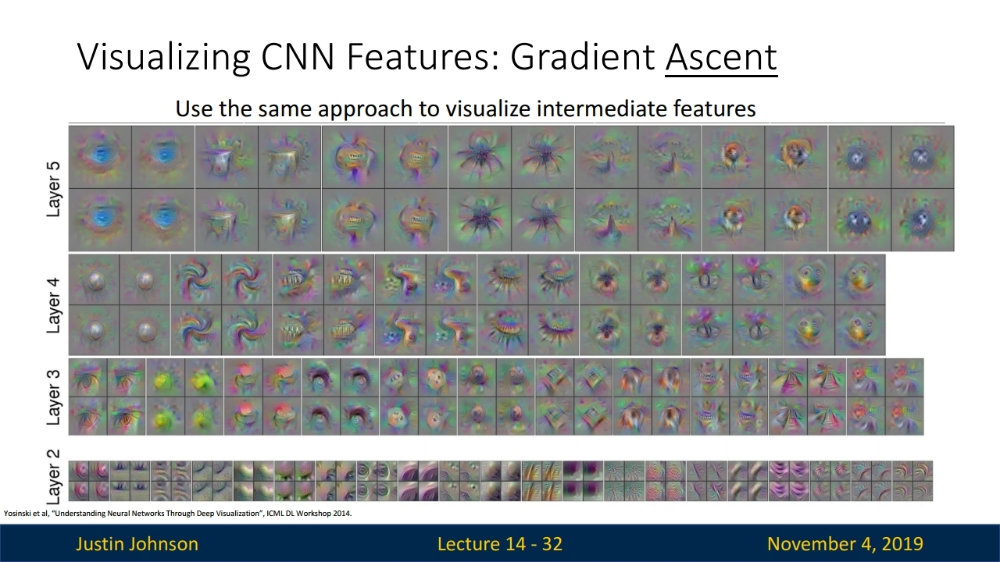

- 이런 방법을 최종 스코어에만 적용하는 것이 아니라 중간 뉴런을 최대화시키는 이미지를 생성해 볼 수도 있음

- 여기서 이미지가 큰 것은 receptive field가 크다는 것 의미


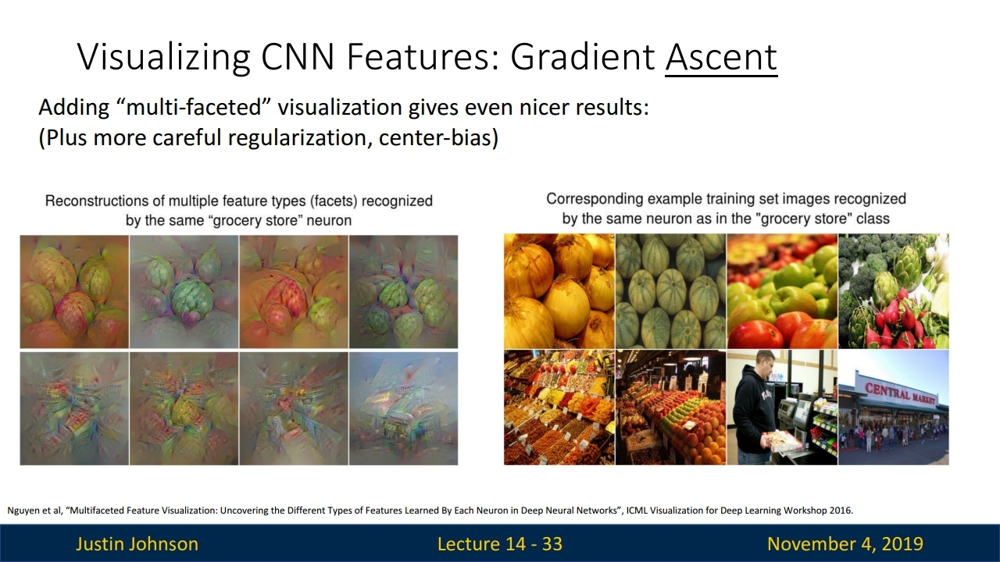

- Multimodality도 최적화 과정 속에서 다루고 있다.
위의 이미지들은 식료품점(grocery store)으로 labeling 되어 있다.

- 각 class 마다 clustering algorithm을 수행
한 class 내에서 서로 다른 mode 들끼리 다시 class 가 나뉜다.
그리고 나뉜 mode 들과 가까운 곳으로 초기화를 해주게 된다.

- 위의 이미지는 매우 다름, 많은 클래스들이 이렇게 multimodality를 가지고 있는데, 이미지를 생성할 때 이런 식으로 `multimodality를 명시`하게 되면 아주 좋은(다양한) 결과를 얻을 수 있음


- 식료품점에 관련된 이미지를 판단하는 뉴런에서 결과물로 만들어낸 부분을 시각화한듯

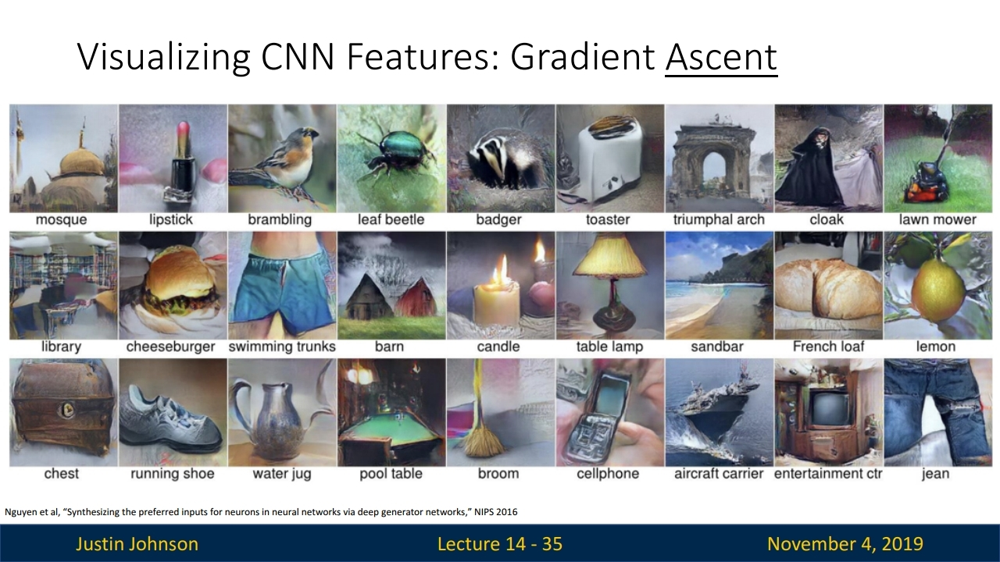

- 위의 이미지들은 FC6 를 최적화하여 ImageNet의 특정 클래스를 최대화하는 이미지를 생성해 낸 결과물

- feature inversion network 등을 사용해야 함.

- (논문) 이미지 생성 문제에서 사전 지식(priors)를 추가하게 된다면 리얼한 이미지를 만들 수 있음.

### [ 참 고 ]

1. CS231n: https://younghk.netlify.app/posts/cs231n-lecture-13---visualizing-and-understanding/

2. Guided backprop: https://donghwa-kim.github.io/guidedprop.htm

3. Gradient Ascent: https://yeoulcoding.tistory.com/77

4. normalization               
     (1) https://blog.airlab.re.kr/2019/08/Group-Normalization            
     (2) https://m.blog.naver.com/chrhdhkd/222014776700
     
5. Grab Matrix, Artistic Style Transfer : https://kyounju.tistory.com/3 https://arclab.tistory.com/169


### ------------------------------------< 핵 심 정 리 >--------------------------------------

1. gradient ascent란 무엇인가? 언제 사용하는가?             

2. guided backprop은 무엇인가? 언제 사용하는가? p21(guided backporp)           

3. "multi-faceted" visualization은 무엇인가? 어떤 장점이 있는가? p33(식료품점 이미지)          

4. Gram Matrix는 무엇인가? 어떤 목적으로 사용하는가?   

5. Batch/Layer/Instance/Group Normalization 각각의 특징은?    

6. DeepDream 에서 작은 점들은 어떻게 지정되는가? (개인적인 궁금증)               

7. conditional instance normalization p90 설명


### --------------------------------------------------------------------------------------------

### 1. gradient ascent란 무엇인가? 언제 사용하는가?

- 해당 모델에서 Loss가 최대가 되는 Parameter를 찾는 방법             
- Backprop과정에서 사용하는 것이 아닌 중요한 feature들을 확대 부각하여 보여주는 용도로 사용            
- gradient ascent를 사용하여 뉴런을 최대로 활성화시키는 합성이미지 만들수 있음. 즉 특정 필터의 반응을 극대화하여 이를 통해 해당 레이어에서 일어나는 일을 시각화.           
- 이 강의에서 이미지를 분류하는데 가장 활성화 되는 뉴런 값을 찾기 위해 활용

$$ I^* = arg max_I f(I) + R(I), \\ f(I): \text{neuron value}, R(I): \text{natural image regularizer} $$

- Gradinet Ascent는 위에서 얘기한 오목 함수의 경우와 더불어 강화학습에서도 사용. 강화 학습에서는 보상의 최대화를 위해 Gradient Ascent를 사용

- Visualising에서는 기존의 Gradient Descent로 구한 부분을 타고 위로 올라가야 하기 때문에 Gradient Ascent를 사용


(1) 정의: 해당 모델에서 Loss가 최대가 되는 Parameter를 찾는 방법임           

(2) 목적: 이 방법으로 중요한 Feature들을 부각시켜서 보여줄 수 있기 때문에 Deep Learning Visualization에서 중요한 역할을 차지함. Gradient Ascent를 통해서 뉴런을 최대로 활성화 시키는 합성 이미지를 만들어 낼 수 있고, 이것이 해당 레이어에서 일어나는 일을 시각화 하는 단서를 제공하게 됨

<br/>

### 2. guided backprop은 무엇인가? 언제 사용하는가?

- positive gradient만을 visualizing한 것임.

- (1) gradient가 0보다 크고 & (2) ReLU output이 양수부분인 gradient만 feature map에 곱하는 방식임 (weighted-average)

- 이미지 인식에서 활성화되는 부분을 색으로 확인한 것을 윤곽으로 확인

-그림 설명
* Foward pass를 통해 ReLU output을 구함
* Backpropagation - Backward pass는 ReLU output인 (1,2)map의 양수 부분에만 gradient를 구함
* Deconvnet - Backward pass는 gradient가 양수인 부분의 gradient 구함
* Guided Backpropagation - Backward pass는 (1) gradient가 0보다 크고 (2) ReLU output이 양수부분인 gradient만 feature map에 곱하는 방식임 (weighted-average)


(1) 정의: 일반적인 backpropagation에 상위 레이어로부터의 추가적인 guidance 신호를 제공하므로 guided backpropagation이라고 불린다. 이 방법은 우리가 시각화 하려는 상위 레이어의 특정 부분을 비활성화 시키려고 하는 뉴런들에 해당하는 음의 기울기 흐름이 역전파 되는 것을 막아준다.             

(2) 장점: guided backpropagation은 backpropagation과 deconvnet을 결합한 형태로, 둘 중 하나라도 음수라면 해당 값을 0으로 처리하여, 다른 방법에 비해서 더 적은 수의 gradient를 이미지 재구축에 사용하므로 더 깔끔하게 시각화를 할 수 있다

<br/>

### 3. "multi-faceted" visualization은 무엇인가? 어떤 장점이 있는가?  p33(식료품점 이미지)

- 다각적 시각화 (multi-faceted visualization)은 다양한 regularization과 bias를 사용하여 이미지 features가 한눈에 보이는 결과를 가진 시각화를 하는것을 말합니다.


(1) 정의: 다측면 시각화 방법은 뉴런을 활성화 시키는 각 이미지의 유형들을 합성화 시켜서 시각화 해줌으로써 각 뉴런의 여러 측면들을 명시적으로 밝혀내는 방법이다.     

(2) 장점: 지금까지 시각화 방법은 각 뉴련이 한 가지 유형의 특징 만 감지한다고 가정했었으므로 여러 다른 측면에 관계없이 이미지 시각화를 단순화 시킴으로써 그 표현에 한계가 있었다. 하지만 우리는 뉴런이 여러 가지 유형의 특징에 반응하여 발화한다는 점에서 다각적인 측면을 활성화 시켜서 시각화 하면 좀 더 이해하기 쉬운 이미지 시각화 작업이 일어난다.


<br/>

### 4. Gram Matrix는 무엇인가? 어떤 목적으로 사용하는가?   

- Gram Matrix의 역할은 l층에 있는 Style Representation들의 서로 내적하여 하여 style cost를 구한다. 즉, l층에 있는 모든 Style과 x사이의 Style Representation의 평균값을 구해 loss를 minimize해줌

- Gram Matrix는 convNet에 특정 층에서 가진 이미지 정보를 채널 값(C)의 정규화 되지 않은 공분산 행렬로 만든 구조              
- 여기서 GramMatrix를 사용하는 이유는 기존의 (CxHxW)의 연산을 C x(HW)로 만들어서 연산량을 줄이는 효과를 가지고 있고              
- 추가로, GramMatrix를 만들 HW pair의 각 부분이 활성화 되는 부분이면 활성화가 되고 활성화 되지 않으면 활성화가 되지 않기 때문에                  
공간적인 정보는 사라져도 상관성만은 가지고 있기에 텍스처 합성에 style 부분으로 사용됨.


- $$ G^l_{ij} = \Sigma_k F^l_{ik} F^l_{jk}$$

<br/>

### 5. Batch/Layer/Instance/Group Normalization 각각의 특징은?    

- **Batch Norm**은 특징맵의 평균과 분산값을 배치단위로 계산해서 정규화.

- **Layer Norm**은 Feature 차원 Normalization 임.  데이터의 한 이터레이션마다 평균과 표준편차를 구해주는 것.

- **Instance Norm**은 각 채널마다 Normalization 해주는 방법. real-time generation에 효과적 이라고 알려져 있다.

- **Group Norm**은 채널을 그룹지어서 그룹단위로 Normalization 하는 방법. Layer와 Instance의 중간.


<br/>


### 6. DeepDream 에서 작은 점들은 어떻게 지정되는가? (개인적인 궁금증)        
이전 슬라이드에서 이미지를 인식하는데 활성화가 강하게 되는 부분을 색으로 표현했는데 해당 부분에 원본 이미지를 인식하는데 사용된 가중치(기존에 학습된 필터들의 평균)이 합성된 것이다.

<br/>


### 7. conditional instance normalization p90 설명
